# Project Name- Red Wine Quality Prediction 

# Project Description
The dataset is related to red and white variants of the Portuguese "Vinho Verde" wine. Due to privacy and logistic issues, only physicochemical (inputs) and sensory (the output) variables are available (e.g. there is no data about grape types, wine brand, wine selling price, etc.).

This dataset can be viewed as classification task. The classes are ordered and not balanced (e.g. there are many more normal wines than excellent or poor ones). Also, we are not sure if all input variables are relevant. So it could be interesting to test feature selection methods.

What might be an interesting thing to do, is to set an arbitrary cutoff for your dependent variable (wine quality) at e.g. 7 or higher getting classified as 'good/1' and the remainder as 'not good/0'. This allows you to practice with hyper parameter tuning on e.g. decision tree algorithms looking at the ROC curve and the AUC value.

You need to build a classification model.

# Inspiration
Use machine learning to determine which physiochemical properties make a wine 'good'!

Raw_Data- https://github.com/FlipRoboTechnologies/ML-Datasets/blob/main/Red%20Wine/winequality-red.csv

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
df=pd.read_csv('wine.csv')
df

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


Here 12 columns are present including 1 output ("quality") columns, 

In [3]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


In [4]:
df.tail()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5
1598,6.0,0.310,0.47,3.6,0.067,18.0,42.0,0.99549,3.39,0.66,11.0,6


In [5]:
df.columns

Index(['fixed acidity', 'volatile acidity', 'citric acid', 'residual sugar',
       'chlorides', 'free sulfur dioxide', 'total sulfur dioxide', 'density',
       'pH', 'sulphates', 'alcohol', 'quality'],
      dtype='object')

In [6]:
df.shape

(1599, 12)

In [7]:
df.dtypes

fixed acidity           float64
volatile acidity        float64
citric acid             float64
residual sugar          float64
chlorides               float64
free sulfur dioxide     float64
total sulfur dioxide    float64
density                 float64
pH                      float64
sulphates               float64
alcohol                 float64
quality                   int64
dtype: object

There are only one types of data (float64)

In [8]:
df.isnull().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64

There are no any null values are present in any columns 

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


This gives the brief about the dataset which includes indexing type, column type, o null values and memory usage.

<Axes: >

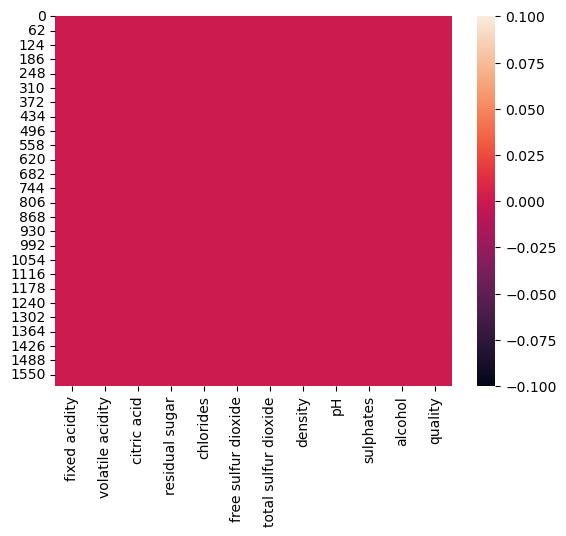

In [10]:
# Lets visualize any null values using heatmap
sns.heatmap(df.isnull())

here We can clearly see that there are no any missing values are present.

In [11]:
# Checking number of unique values in each column
df.nunique().to_frame("No. of unique values")

,No. of unique values
fixed acidity,96
volatile acidity,143
citric acid,80
residual sugar,91
chlorides,153
free sulfur dioxide,60
total sulfur dioxide,144
density,436
pH,89
sulphates,96


In [12]:
# checking the values count of each columns 
for i in df.columns:
    print(df[i].value_counts())

fixed acidity
7.2     67
7.1     57
7.8     53
7.5     52
7.0     50
        ..
13.5     1
13.8     1
13.4     1
4.7      1
5.5      1
Name: count, Length: 96, dtype: int64
volatile acidity
0.600    47
0.500    46
0.430    43
0.590    39
0.360    38
         ..
1.035     1
0.565     1
1.130     1
1.115     1
1.090     1
Name: count, Length: 143, dtype: int64
citric acid
0.00    132
0.49     68
0.24     51
0.02     50
0.26     38
       ... 
0.72      1
0.62      1
0.75      1
1.00      1
0.78      1
Name: count, Length: 80, dtype: int64
residual sugar
2.00     156
2.20     131
1.80     129
2.10     128
1.90     117
        ... 
4.25       1
2.85       1
3.45       1
2.35       1
13.90      1
Name: count, Length: 91, dtype: int64
chlorides
0.080    66
0.074    55
0.076    51
0.078    51
0.084    49
         ..
0.108     1
0.148     1
0.143     1
0.222     1
0.230     1
Name: count, Length: 153, dtype: int64
free sulfur dioxide
6.0     138
5.0     104
10.0     79
15.0     78
12.0     75


In [13]:
# Checking Duplicate values in Dataframe
print('Total Duplicate Rows are ', df.duplicated().sum())

Total Duplicate Rows are  240


# Description of Dataset

In [14]:
# full Statitical information of dataset
df.describe()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


# Observation:
1) This gives the statistical information of the numerical columns. The summary of the dataset looks perfect since there is no negative/invalid values present.

2) The counts of all the columns are same which means there are no missing values in the dataset.

3) The median(50%) value is greater than the mean in all columns which means the data is skewed to left in these column.

4) By summarizing the data we can observe there is a huge differences between 75% and max in the column of "residual sugar", "free sulfur dioxide", "total sulfur dioxide",   hence in this columns outliers present in the data.

5) We can also notice the Standard deviation, minimum value, 25% percentile values from this describe method.

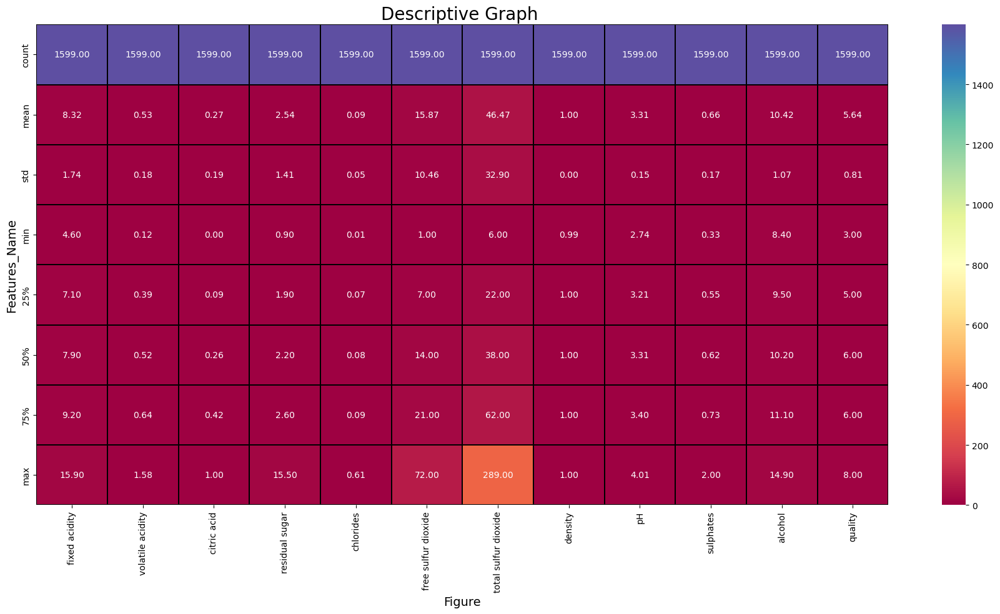

In [15]:
plt.figure(figsize=(22,10))
sns.heatmap(df.describe(),annot=True, fmt='0.2f',linewidth=0.2,linecolor='black',cmap='Spectral')
plt.xlabel('Figure',fontsize=14)
plt.ylabel('Features_Name',fontsize=14)
plt.title('Descriptive Graph ', fontsize=20)
plt.show()

In [16]:
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


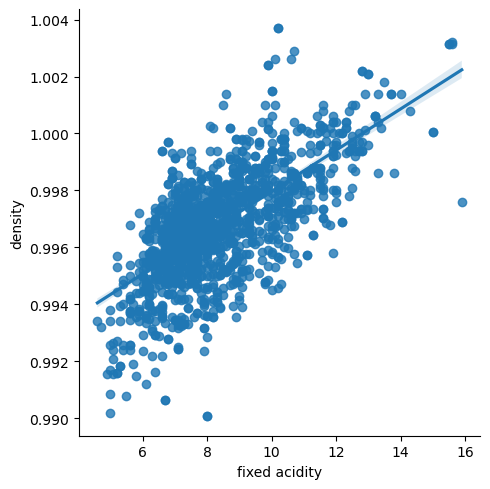

In [17]:
sns.lmplot(x='fixed acidity',y='density',data=df, palette='colorblind')

fixed acidity has a positive correelation with density

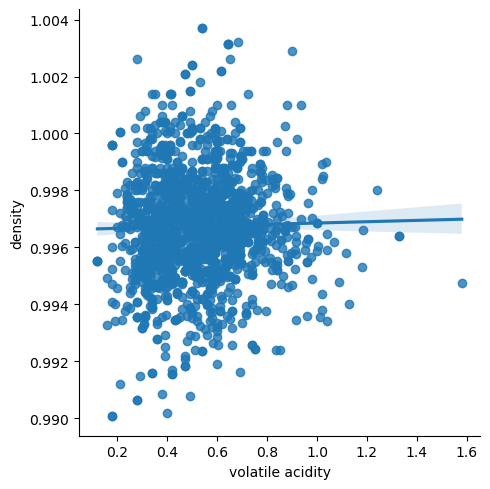

In [18]:
sns.lmplot(x='volatile acidity',y="density",data=df, palette='colorblind')

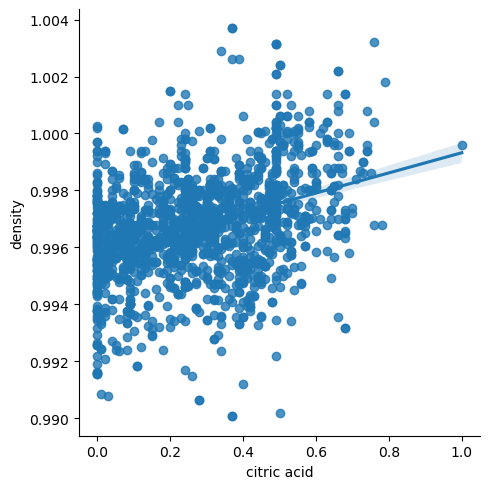

In [19]:
sns.lmplot(x='citric acid',y="density",data=df, palette='table10')

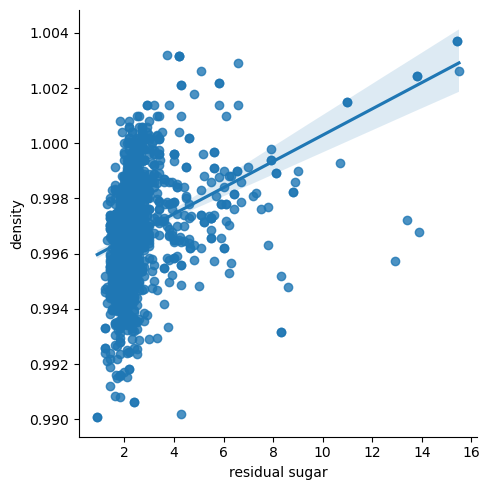

In [20]:
sns.lmplot(x='residual sugar',y="density",data=df, palette='table10')

here is not a good coralation 

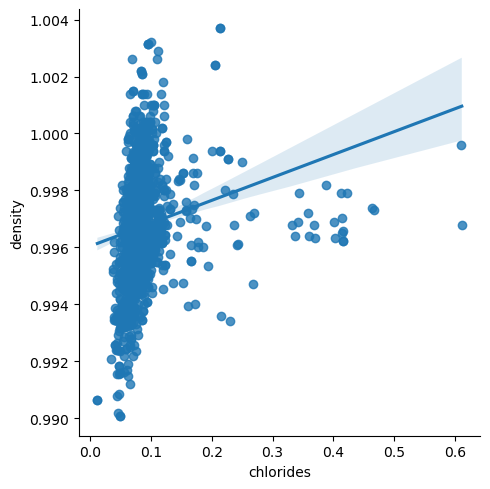

In [21]:
sns.lmplot(x='chlorides',y="density",data=df, palette='table10')

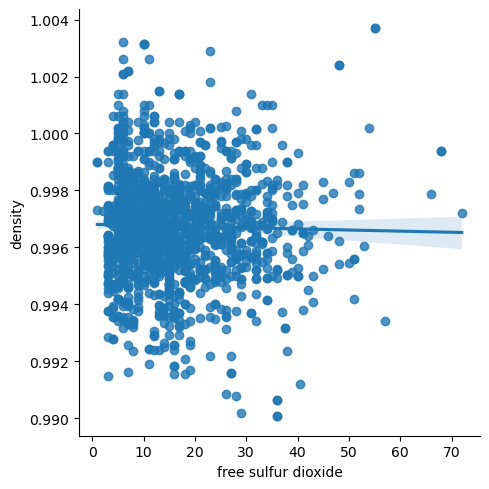

In [22]:
sns.lmplot(x='free sulfur dioxide',y="density",data=df, palette='table10')

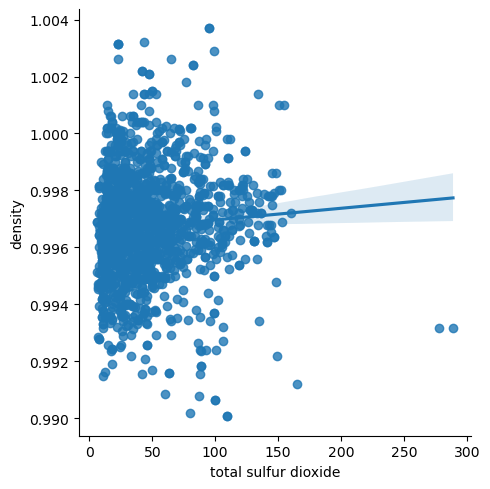

In [23]:
sns.lmplot(x='total sulfur dioxide',y="density",data=df, palette='table10')

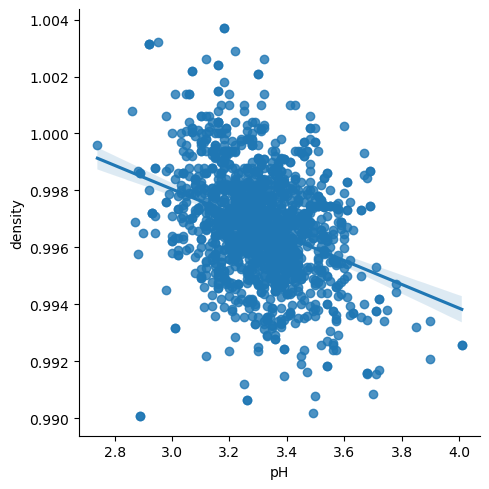

In [24]:
sns.lmplot(x='pH',y="density",data=df, palette='table10')

pH has Negative correelation with density

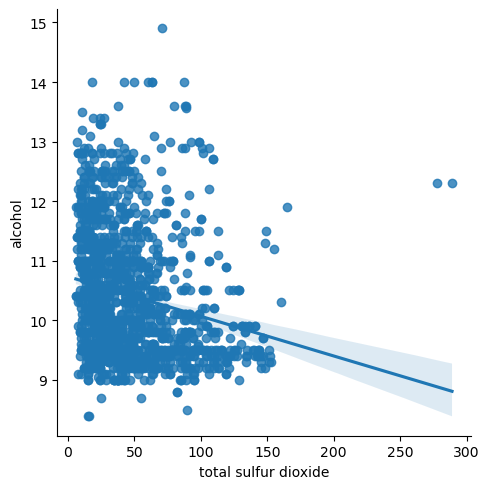

In [25]:
sns.lmplot(x='total sulfur dioxide',y="alcohol",data=df, palette='table10')

total sulfur dioxide has negative corelation with alcohol

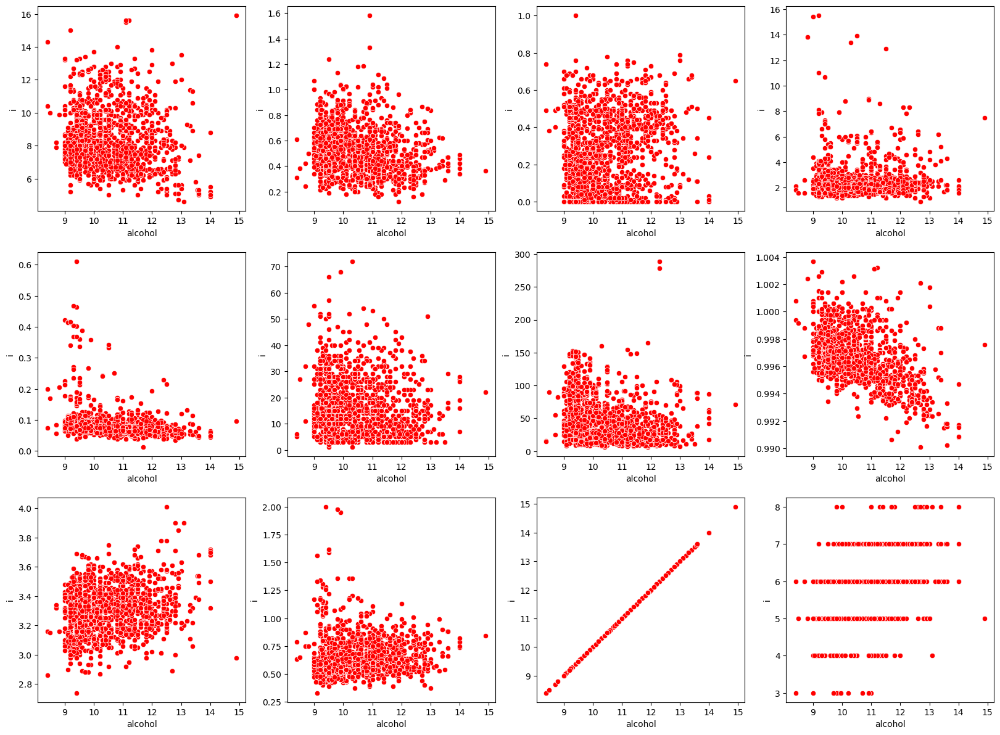

In [26]:
plt.figure(figsize=(20,25))
p=1
for i in df:
    if p<=17:
        plt.subplot(5,4,p)
        sns.scatterplot(x='alcohol',y=i,data=df,color='r')
        plt.xlabel('alcohol')
        plt.ylabel('i')
    p+=1
    
plt.show()

In [27]:
df.head(1)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.7,0.0,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


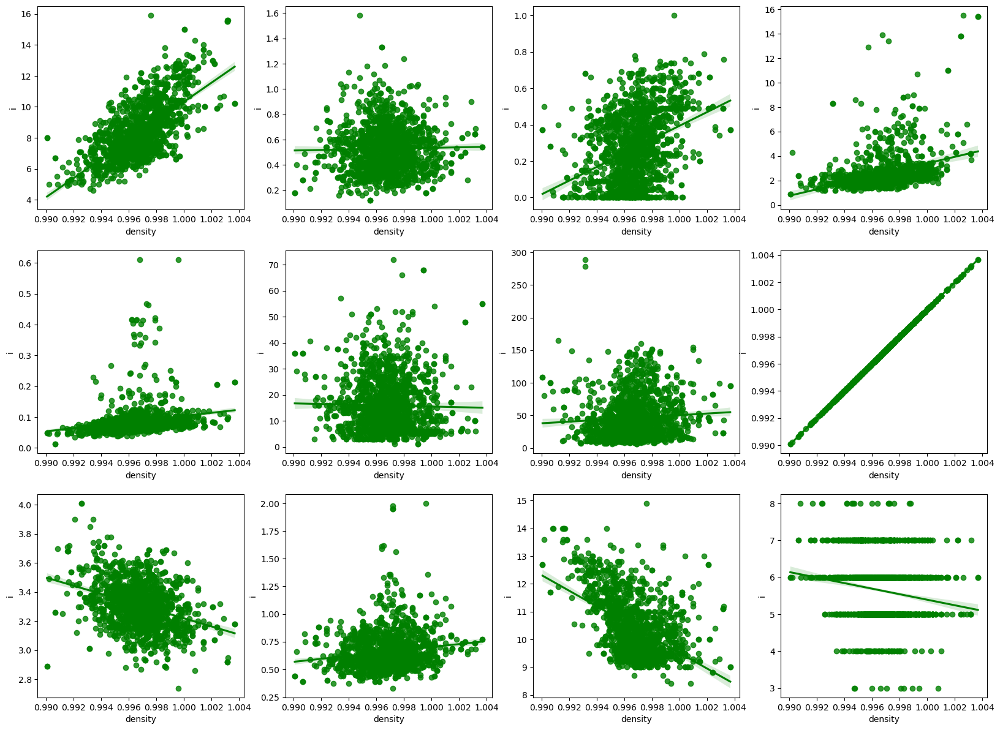

In [28]:
plt.figure(figsize=(20,25))
p=1
for i in df:
    if p<=17:
        plt.subplot(5,4,p)
        sns.regplot(x='density',y=i,data=df,color='g')
        plt.xlabel('density')
        plt.ylabel('i')
    p+=1
    
plt.show()

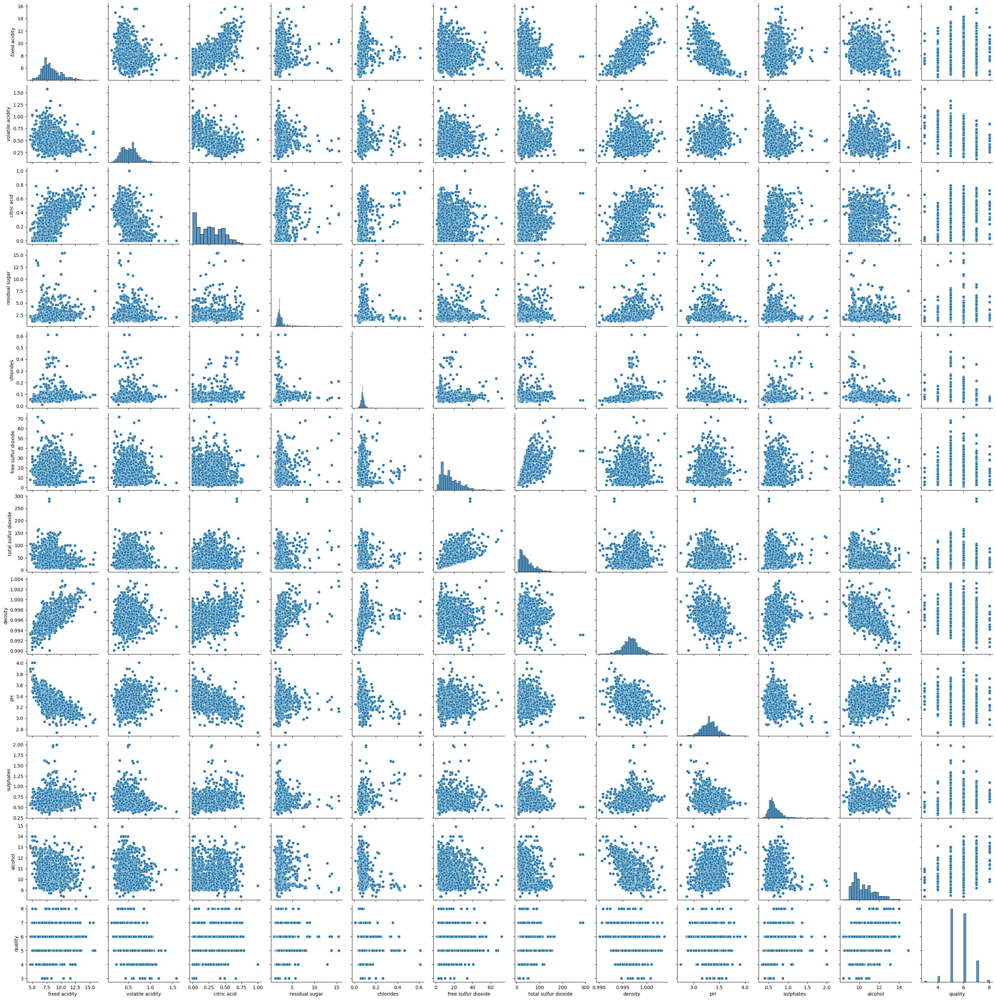

In [29]:
sns.pairplot(data=df, palette='Dark2')

the pairplot gives the pariwise relation between the features. On the diagonal we can notice the distribution plots.

In [30]:
df.head(1)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.7,0.0,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


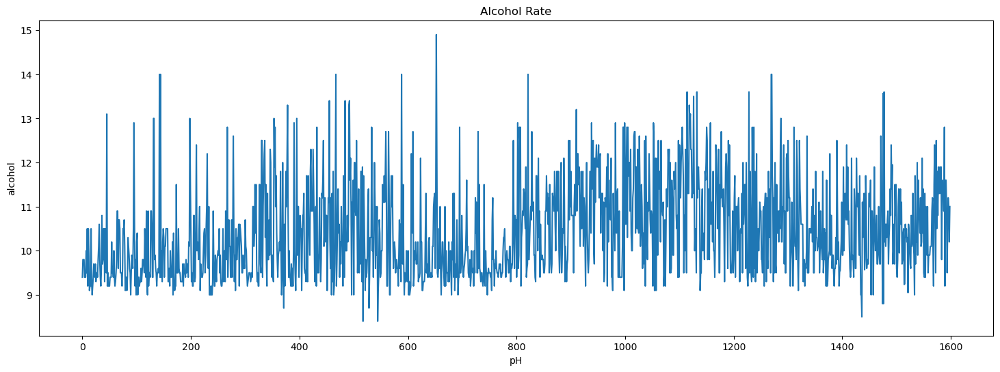

In [31]:
plt.figure(figsize=(18,6))
plt.plot(df.alcohol, label='closing price')
plt.ylabel('alcohol')
plt.xlabel('pH')
plt.title('Alcohol Rate')
plt.show()

Text(0.5, 1.0, 'The General Trand of all values')

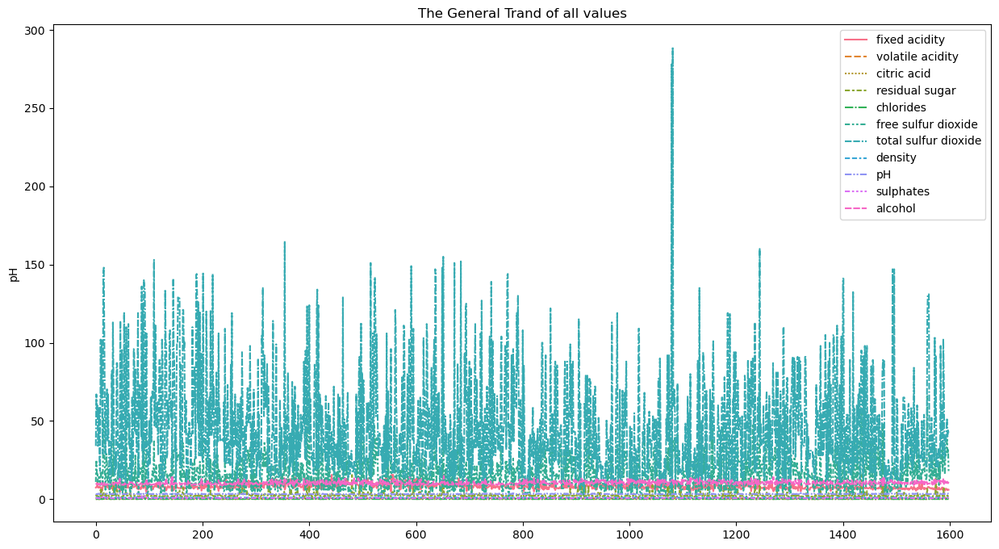

In [32]:
plt.figure(figsize=(15,8))
sns.lineplot(data=df.iloc[:,:-1])
plt.ylabel('pH')
plt.title('The General Trand of all values')

# Find the outliers 

In [33]:
df.head(1)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.7,0.0,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


<Axes: >

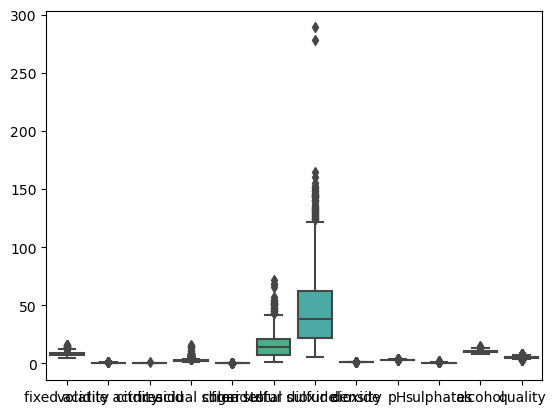

In [34]:
sns.boxplot(data=df)

there are outliers are prsent in all of the columns 

<Axes: >

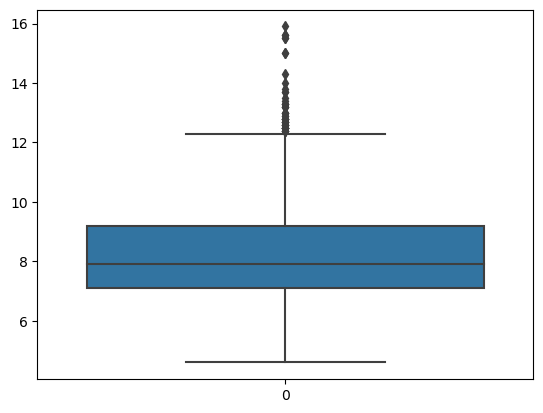

In [35]:
sns.boxplot(df['fixed acidity'])

In [36]:
df.head(1)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.7,0.0,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


<Axes: >

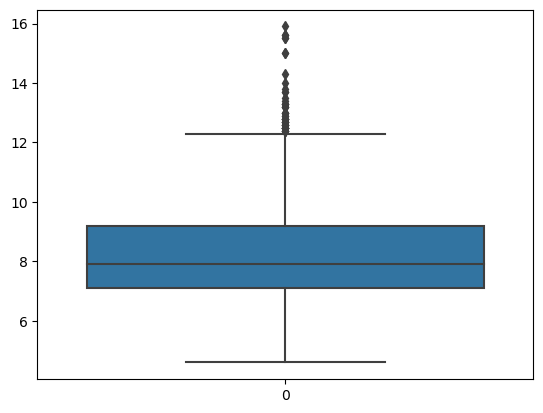

In [37]:
sns.boxplot(df['fixed acidity'])

<Axes: >

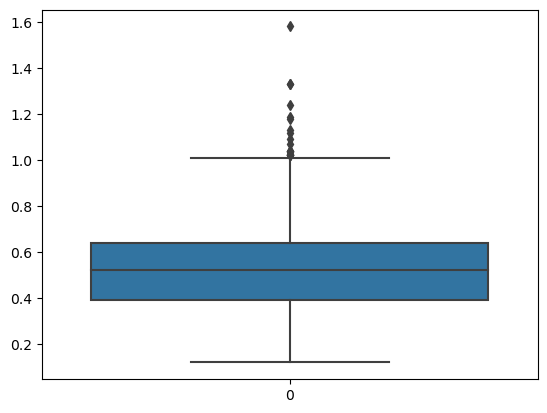

In [38]:
sns.boxplot(df['volatile acidity'])

<Axes: >

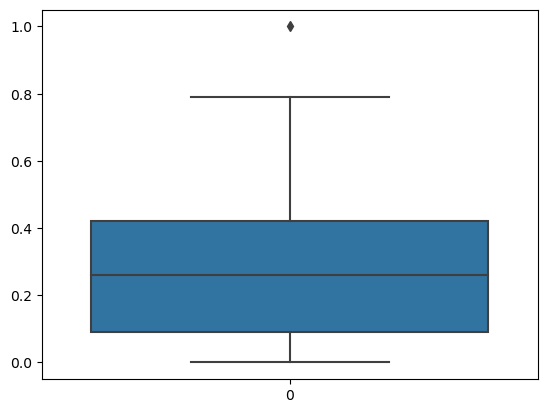

In [39]:
sns.boxplot(df['citric acid'])

<Axes: >

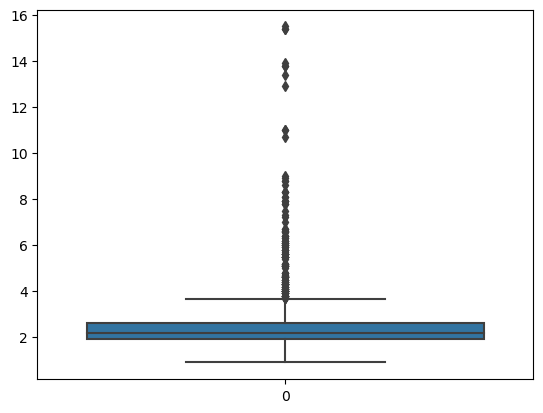

In [40]:
sns.boxplot(df['residual sugar'])

<Axes: >

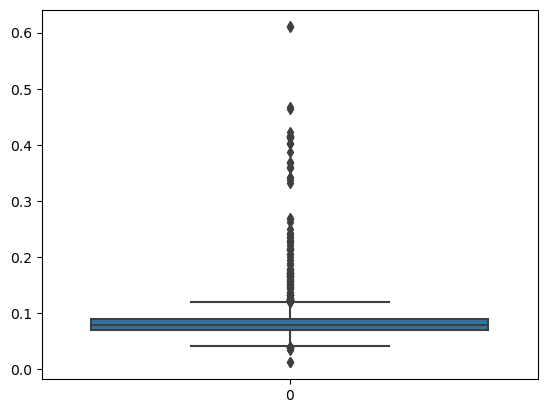

In [41]:
sns.boxplot(df['chlorides'])

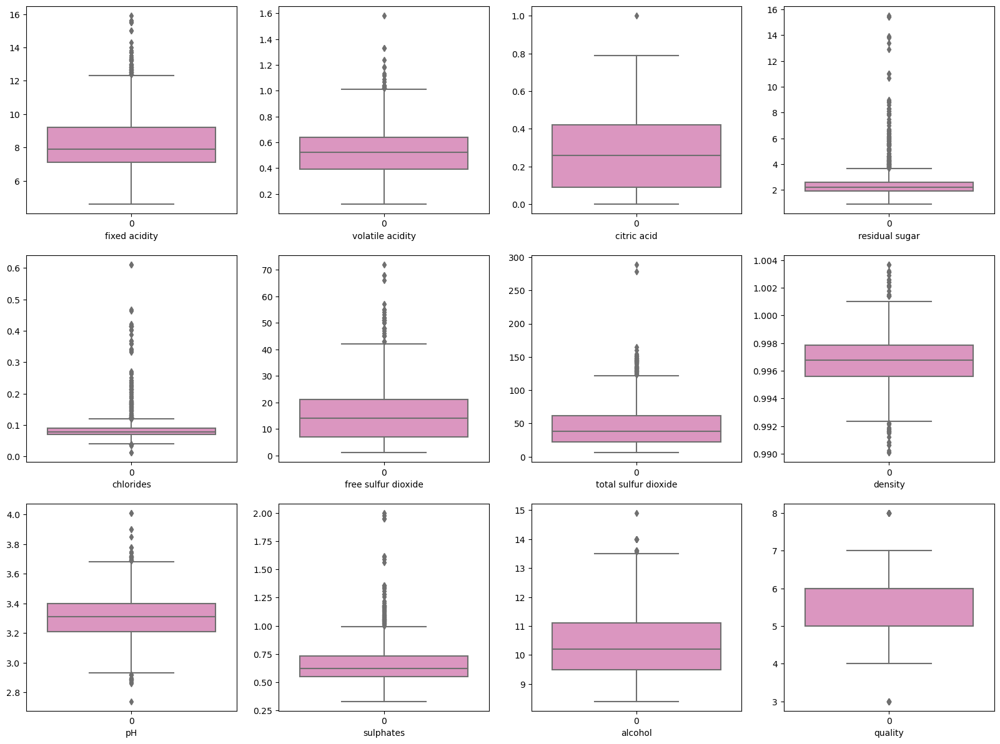

In [42]:
## Lets check the outliers by plotting boxplot.
plt.figure(figsize=(20,25))
p=1
for i in df:
    if p<=13:
        plt.subplot(5,4,p)
        sns.boxplot(df[i], palette='Set2_r')
        plt.xlabel(i)
        
    p+=1
plt.show()

Here we can seen that outliers prsent in all columns 

In [43]:
df.head(1)


,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.7,0.0,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


# Let's Remove the outliers

In [44]:
input=df.iloc[:,:-1]
# input

In [45]:
from scipy.stats import zscore
out_features=input
z=np.abs(zscore(out_features))
z

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,0.528360,0.961877,1.391472,0.453218,0.243707,0.466193,0.379133,0.558274,1.288643,0.579207,0.960246
1,0.298547,1.967442,1.391472,0.043416,0.223875,0.872638,0.624363,0.028261,0.719933,0.128950,0.584777
2,0.298547,1.297065,1.186070,0.169427,0.096353,0.083669,0.229047,0.134264,0.331177,0.048089,0.584777
3,1.654856,1.384443,1.484154,0.453218,0.264960,0.107592,0.411500,0.664277,0.979104,0.461180,0.584777
4,0.528360,0.961877,1.391472,0.453218,0.243707,0.466193,0.379133,0.558274,1.288643,0.579207,0.960246
...,...,...,...,...,...,...,...,...,...,...,...
1594,1.217796,0.403229,0.980669,0.382271,0.053845,1.542054,0.075043,0.978765,0.899886,0.461180,0.072294
1595,1.390155,0.123905,0.877968,0.240375,0.541259,2.211469,0.137820,0.862162,1.353436,0.601055,0.729364
1596,1.160343,0.099554,0.723916,0.169427,0.243707,1.255161,0.196679,0.533554,0.705508,0.542042,0.541630
1597,1.390155,0.654620,0.775267,0.382271,0.264960,1.542054,0.075043,0.676657,1.677400,0.305990,0.209308


In [46]:
# thereshold=3
np.where(z>3)

(array([  13,   14,   15,   15,   17,   17,   19,   33,   38,   42,   43,
          45,   57,   81,   81,   83,   86,   88,   91,   92,   95,  106,
         106,  109,  120,  126,  127,  142,  144,  147,  151,  151,  151,
         151,  163,  164,  169,  169,  181,  199,  226,  226,  240,  243,
         244,  258,  258,  274,  281,  291,  324,  325,  339,  340,  347,
         354,  374,  381,  391,  396,  396,  400,  400,  442,  442,  451,
         467,  480,  480,  494,  515,  544,  554,  554,  555,  555,  557,
         557,  568,  584,  588,  591,  595,  608,  614,  636,  639,  649,
         649,  651,  652,  652,  652,  672,  672,  684,  690,  692,  692,
         695,  723,  724,  730,  754,  776,  777,  795,  821,  836,  837,
         889,  911,  917,  923,  925,  926,  982, 1017, 1018, 1043, 1051,
        1051, 1071, 1074, 1079, 1079, 1081, 1081, 1111, 1114, 1131, 1154,
        1165, 1175, 1186, 1231, 1235, 1244, 1244, 1244, 1260, 1269, 1269,
        1270, 1270, 1288, 1289, 1295, 

Thsi are the outliers present in the columns 

In [47]:
print(z.iloc[15,5],z.iloc[14,5])

3.359038194288537 3.454668962073944


In [48]:
# Now removing the data above  Zscore and creating ne DF
newdf=df[(z<3).all(axis=1)]

In [49]:
newdf

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
1,7.8,0.880,0.00,2.6,0.098,25.0,67.0,0.99680,3.20,0.68,9.8,5
2,7.8,0.760,0.04,2.3,0.092,15.0,54.0,0.99700,3.26,0.65,9.8,5
3,11.2,0.280,0.56,1.9,0.075,17.0,60.0,0.99800,3.16,0.58,9.8,6
4,7.4,0.700,0.00,1.9,0.076,11.0,34.0,0.99780,3.51,0.56,9.4,5
...,...,...,...,...,...,...,...,...,...,...,...,...
1594,6.2,0.600,0.08,2.0,0.090,32.0,44.0,0.99490,3.45,0.58,10.5,5
1595,5.9,0.550,0.10,2.2,0.062,39.0,51.0,0.99512,3.52,0.76,11.2,6
1596,6.3,0.510,0.13,2.3,0.076,29.0,40.0,0.99574,3.42,0.75,11.0,6
1597,5.9,0.645,0.12,2.0,0.075,32.0,44.0,0.99547,3.57,0.71,10.2,5


In [50]:
print(df.shape)
print('after removeing outliers',newdf.shape)

(1599, 12)
after removeing outliers (1458, 12)


In [51]:
print("Raw Data Frame- ", df.shape[0])
print("Clean Data Frame- ", newdf.shape[0])

Raw Data Frame-  1599
Clean Data Frame-  1458


In [52]:
# Checking Percentage how many % of data are removed
print('Data Loss Precentage-',((df.shape[0]-newdf.shape[0])/df.shape[0])*100 )

Data Loss Precentage- 8.818011257035648


In [53]:
(1599-1458)/1599*100

8.818011257035648

In [54]:
df=newdf

# Let's Checking How the Data has been distriubted in each column 

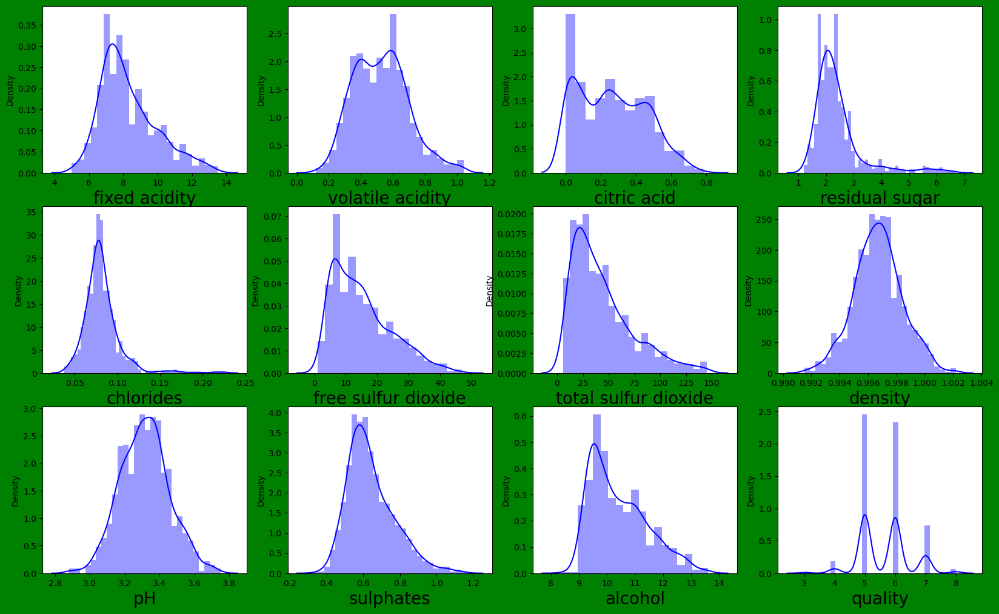

In [55]:
plt.figure(figsize=(20,25),facecolor='green')
plotnumber=1

for column in df:
    if plotnumber<=18:
        ax=plt.subplot(6,4,plotnumber)
        sns.distplot(df[column],color='b')
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.show()

From the above distribution plots we can notice that the data almost looks normal in all the columns except quality

# Checking for Skewness

In [56]:
df.skew()

fixed acidity           0.820879
volatile acidity        0.392097
citric acid             0.292600
residual sugar          2.450707
chlorides               2.307274
free sulfur dioxide     0.869727
total sulfur dioxide    1.185230
density                 0.055543
pH                      0.113039
sulphates               0.893297
alcohol                 0.757396
quality                 0.248823
dtype: float64

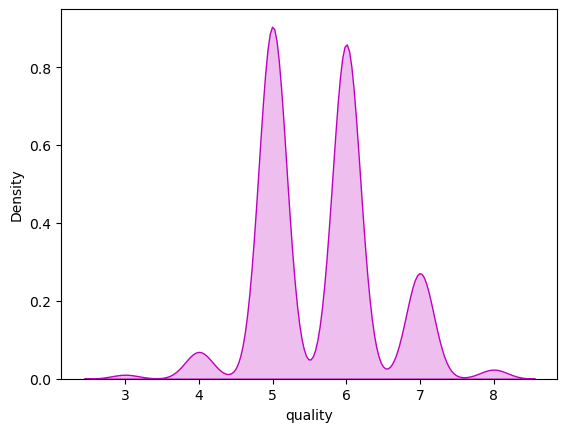

In [57]:
sns.distplot(df['quality'],color='m',kde_kws={'shade':True},hist=False)
plt.show()

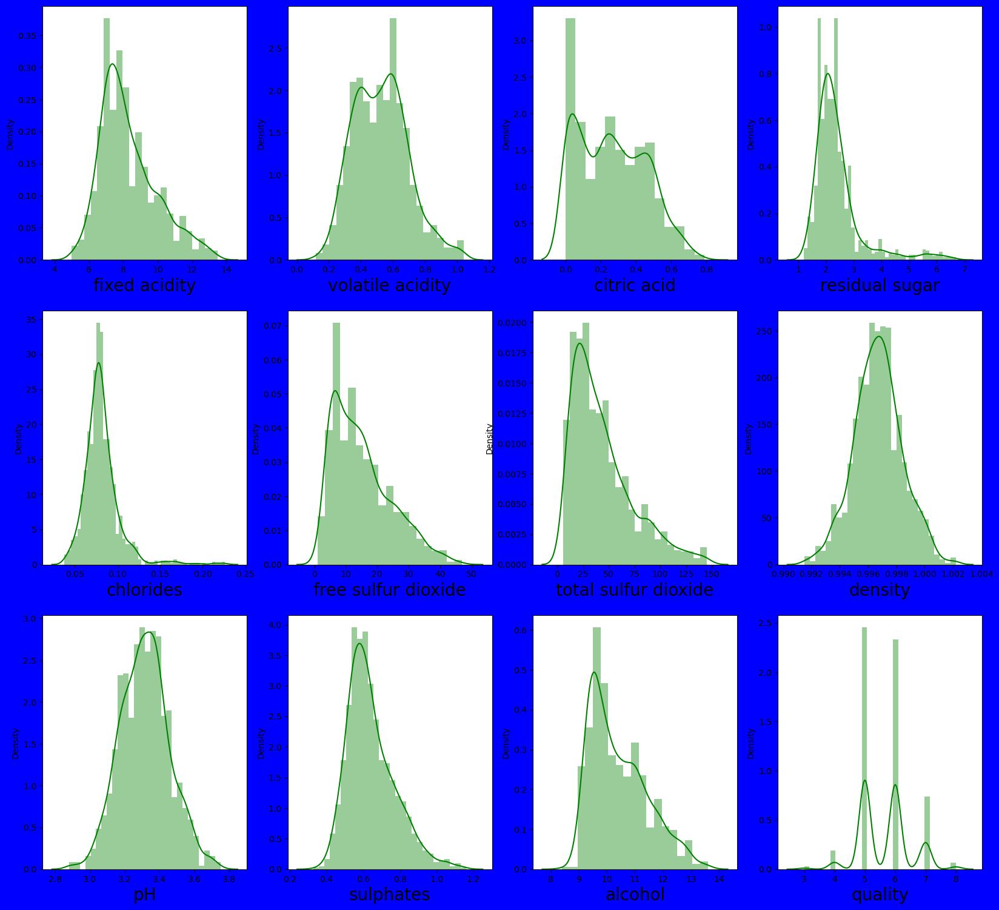

In [58]:
# let us visulize again 
plt.figure(figsize=(20,25),facecolor='blue')
plotnumber=1

for column in df:
    if plotnumber<=13:
        ax=plt.subplot(4,4,plotnumber)
        sns.distplot(df[column],color='green')
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.show()

# Check Correlation between target variable and independent variables

In [59]:
df.corr()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
fixed acidity,1.000000,-0.296566,0.699747,0.175809,0.187853,-0.146702,-0.098843,0.660497,-0.704507,0.200796,-0.018384,0.135851
volatile acidity,-0.296566,1.000000,-0.589286,0.032331,0.070307,0.008824,0.104585,-0.000446,0.252900,-0.350547,-0.212767,-0.362783
citric acid,0.699747,-0.589286,1.000000,0.178784,0.104950,-0.072097,0.007320,0.372338,-0.521270,0.303401,0.164420,0.238244
residual sugar,0.175809,0.032331,0.178784,1.000000,0.121287,-0.005795,0.091381,0.343236,-0.072787,0.071218,0.162423,0.053999
chlorides,0.187853,0.070307,0.104950,0.121287,1.000000,-0.057342,0.040874,0.330104,-0.183105,0.025329,-0.209711,-0.120832
free sulfur dioxide,-0.146702,0.008824,-0.072097,-0.005795,-0.057342,1.000000,0.660348,-0.039334,0.107444,0.059713,-0.076400,-0.063786
total sulfur dioxide,-0.098843,0.104585,0.007320,0.091381,0.040874,0.660348,1.000000,0.116386,-0.007726,-0.037164,-0.257834,-0.222634
density,0.660497,-0.000446,0.372338,0.343236,0.330104,-0.039334,0.116386,1.000000,-0.311217,0.127562,-0.469611,-0.177758
pH,-0.704507,0.252900,-0.521270,-0.072787,-0.183105,0.107444,-0.007726,-0.311217,1.000000,-0.039558,0.136659,-0.084922
sulphates,0.200796,-0.350547,0.303401,0.071218,0.025329,0.059713,-0.037164,0.127562,-0.039558,1.000000,0.240684,0.379814


This gives the correlation between the dependent and independent variables. We can visulize this by plotting heatmap.

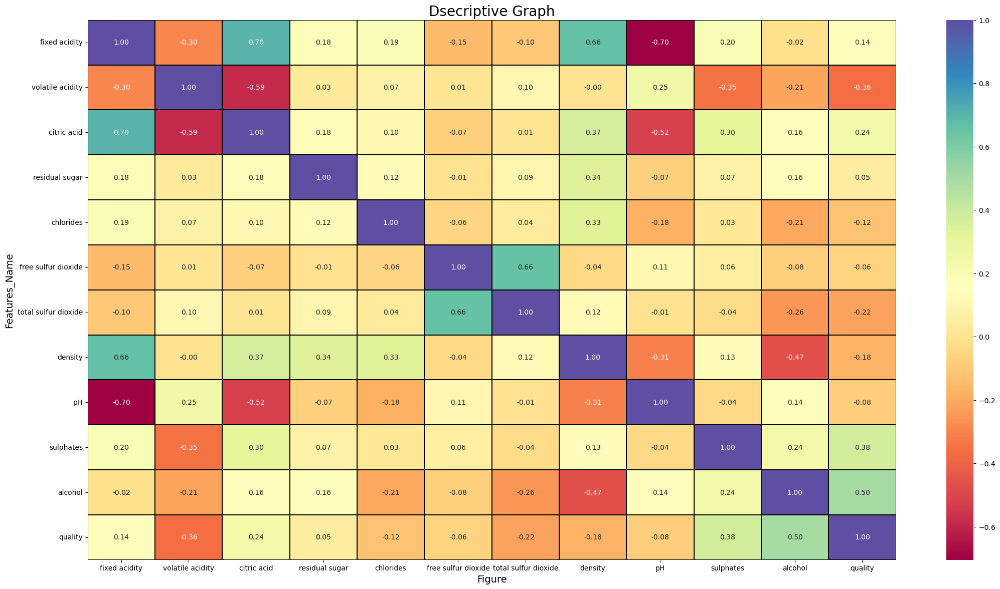

In [60]:
plt.figure(figsize=(26,14))
sns.heatmap(df.corr(),annot=True,fmt='0.2f',linewidth=0.2,linecolor='black',cmap='Spectral')
plt.xlabel('Figure',fontsize=14)
plt.ylabel('Features_Name',fontsize=14)
plt.title('Dsecriptive Graph',fontsize=20)
plt.show()

In [80]:
type(df)

pandas.core.frame.DataFrame

In [81]:
df.corr().quality.sort_values()

volatile acidity       -0.362783
total sulfur dioxide   -0.222634
density                -0.177758
chlorides              -0.120832
pH                     -0.084922
free sulfur dioxide    -0.063786
residual sugar          0.053999
fixed acidity           0.135851
citric acid             0.238244
sulphates               0.379814
alcohol                 0.497554
quality                 1.000000
Name: quality, dtype: float64

# Visualizing the correlation between label and fratures using bar plot

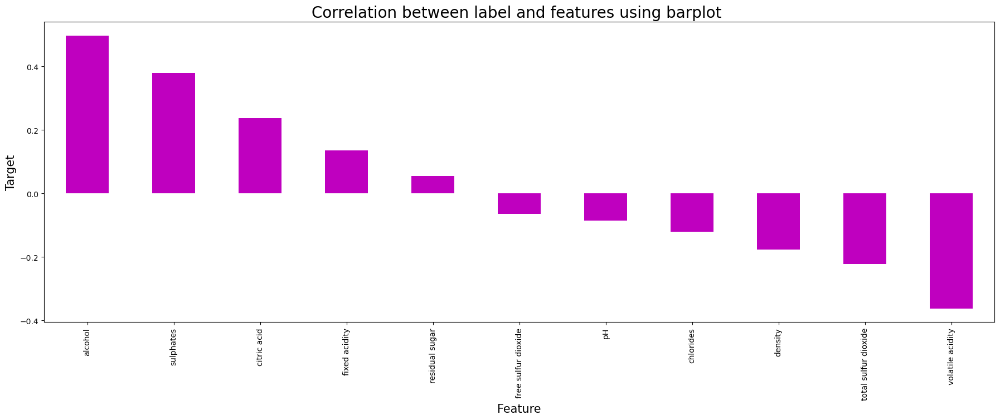

In [62]:
plt.figure(figsize=(22,7))
df.corr()['quality'].sort_values(ascending=False).drop(['quality']).plot(kind='bar',color='m')
plt.xlabel('Feature',fontsize=15)
plt.ylabel('Target',fontsize=15)
plt.title("Correlation between label and features using barplot ", fontsize=20)
plt.show()

# Separating Features and label

In [63]:
# Separating the independent and target variables into x and y

x=df.iloc[:,:-1]
y=df.iloc[:,-1]

print('Feature Dimension =', x.shape)
print('Label Dismension ',y.shape)

Feature Dimension = (1458, 11)
Label Dismension  (1458,)


# Feature Scaling using Standard Scalarization

In [64]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
x=pd.DataFrame(scaler.fit_transform(x),columns=x.columns)
x

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,-0.554045,1.038708,-1.387413,-0.564985,-0.260755,-0.439085,-0.328538,0.629873,1.374768,-0.635382,-0.996573
1,-0.311190,2.101325,-1.387413,0.244255,0.776445,1.063952,0.793739,0.047678,-0.823752,0.289771,-0.604915
2,-0.311190,1.392914,-1.178214,-0.102562,0.493572,-0.009646,0.351630,0.164117,-0.398232,0.058483,-0.604915
3,1.753082,-1.440732,1.541370,-0.564985,-0.307900,0.205073,0.555680,0.746312,-1.107432,-0.481190,-0.604915
4,-0.554045,1.038708,-1.387413,-0.564985,-0.260755,-0.439085,-0.328538,0.629873,1.374768,-0.635382,-0.996573
...,...,...,...,...,...,...,...,...,...,...,...
1453,-1.282612,0.448365,-0.969015,-0.449379,0.399281,1.815470,0.011546,-1.058494,0.949248,-0.481190,0.080487
1454,-1.464753,0.153194,-0.864416,-0.218168,-0.920791,2.566989,0.249605,-0.930411,1.445688,0.906541,0.765889
1455,-1.221898,-0.082944,-0.707517,-0.102562,-0.260755,1.493391,-0.124487,-0.569449,0.736488,0.829444,0.570060
1456,-1.464753,0.714019,-0.759816,-0.449379,-0.307900,1.815470,0.011546,-0.726642,1.800288,0.521060,-0.213256


we have scaled the data using Standard Scalarization method to overcome the issue of baisness

# Checking Variance inflation Factor(VIF)

In [65]:
# Finding Variance inflation factor in each scaled column i.e, x.shape[1] (1/(1-R2))

from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif['VIF values']=[variance_inflation_factor(x.values, i) for i in range(len(x.columns))]
vif['Features']=x.columns

vif

,VIF values,Features
0,7.941157,fixed acidity
1,1.869151,volatile acidity
2,3.200976,citric acid
3,1.657880,residual sugar
4,1.170025,chlorides
5,1.936150,free sulfur dioxide
6,2.182674,total sulfur dioxide
7,6.420347,density
8,3.199093,pH
9,1.311525,sulphates


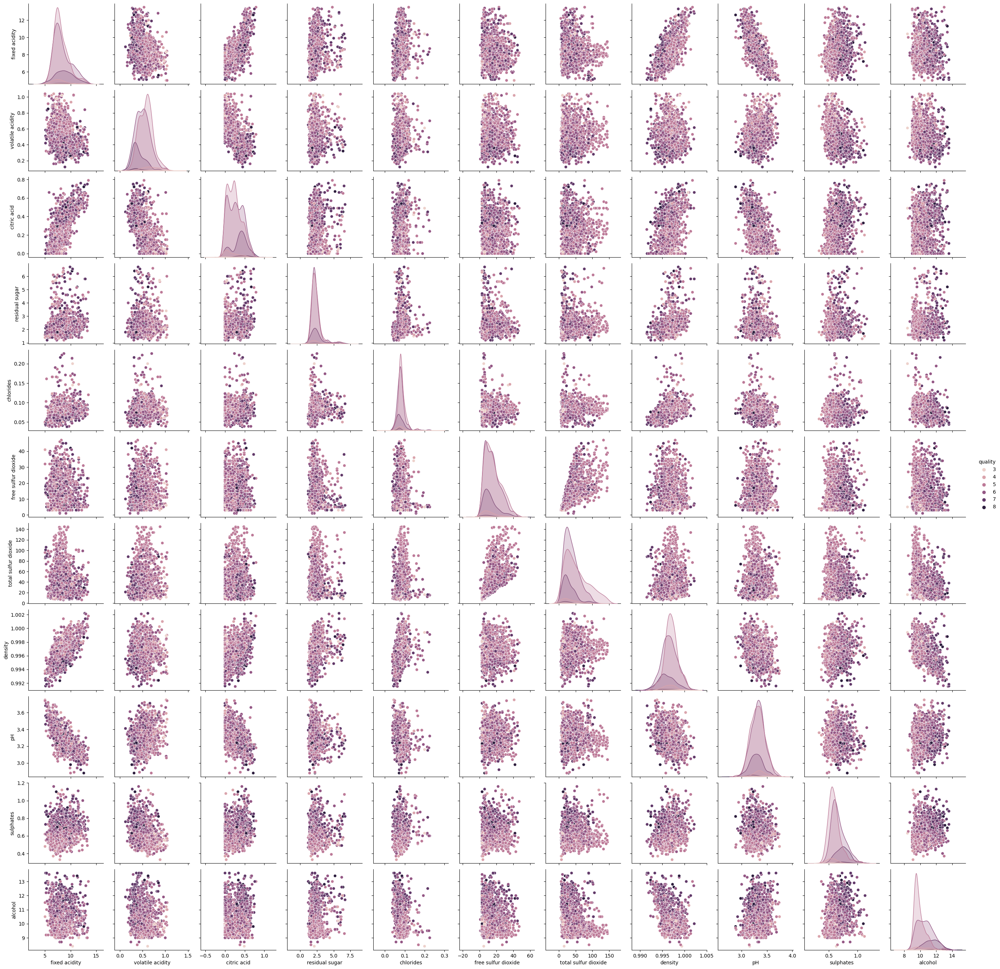

In [66]:
sns.pairplot(df,hue='quality')

# Modelling

In [67]:
import numpy as np
import pandas as pd
from sklearn.naive_bayes import MultinomialNB
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report
from sklearn.model_selection import train_test_split
import warnings
warnings.filterwarnings('ignore')

In [68]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.linear_model import Lasso,Ridge

In [69]:
# Testing 
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30,random_state=42)

In [70]:
y_train.shape

(1020,)

In [71]:
y_test.shape

(438,)

In [72]:
x_train.shape

(1020, 11)

In [73]:
x_test.shape

(438, 11)

In [74]:
# NOW CALL THE MultinomialNB()
mnb=MultinomialNB()

In [75]:
mnb

MultinomialNB()

In [76]:
# importing necessary libraies:
import sklearn
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.linear_model import LinearRegression

In [77]:
# finding the best Random State

maxAccu=0
maxRS=0
for i in range(1,200):
    x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=.30, random_state=i)
    lr=LinearRegression()
    lr.fit(x_train,y_train)
    pred=lr.predict(x_test)
    acc=r2_score(y_test,pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print('Maximum r2 score is ', maxAccu, 'On Randm_state',maxRS)
    

Maximum r2 score is  0.43342188339989585 On Randm_state 169


In [84]:
score1=cross_val_score(lr,x,y)
print(score1)
print(score1.mean())
print('Difference between R2 scored and cross validation score is ', (r2_score(y_test,pred) - score1.mean())*100)


[0.20275411 0.36613641 0.38568425 0.37944497 0.26203479]
0.3192109052116909
Difference between R2 scored and cross validation score is  8.439320327772487


In [83]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.linear_model import Lasso,Ridge
from sklearn.model_selection import cross_val_score

In [86]:
# Random Foreset Regressor()
RFR=RandomForestRegressor()
RFR.fit(x_train,y_train)
pred_RFR=RFR.predict(x_test)
pred_train=RFR.predict(x_train)

print('R2_score: ', r2_score(y_test,pred_RFR))
print('R2_score on training Date: ', r2_score(y_train,pred_train)*100)
print('Mean Absolute Error: ', mean_absolute_error(y_test,pred_RFR))
print('Mean Squared Error: ', mean_squared_error(y_test, pred_RFR))
print('Rooot Mean Swuared Error: ', np.sqrt(mean_squared_error(y_test,pred_RFR)))

R2_score:  0.44429489107570297
R2_score on training Date:  92.89234067005223
Mean Absolute Error:  0.4318264840182648
Mean Squared Error:  0.3594077625570776
Rooot Mean Swuared Error:  0.5995062656528934


In [87]:
score2=cross_val_score(RFR,x,y)
print(score2)
print(score2.mean())
print('Difference between R2 score and cross validation score is - ', (r2_score(y_test,pred_RFR)-score2.mean())*100)


[0.27128412 0.37227665 0.38055063 0.31366793 0.25488868]
0.3185336001961729
Difference between R2 score and cross validation score is -  12.576129087953008


In [88]:
# K-Nearest Neighbors (KNN)
knn=KNN()
knn.fit(x_train,y_train)
pred_knn=knn.predict(x_test)
pred_train=knn.predict(x_train)
print('R2_score: ',r2_score(y_test,pred_knn))
print('R2_score on training Data: ', r2_score(y_train,pred_train)*100)
print('Mean Absolute Error: ', mean_absolute_error(y_test,pred_knn))
print('Mean Squared Error: ', mean_squared_error(y_test,pred_knn))
print('Root Mean Squared Error: ', np.sqrt(mean_squared_error(y_test,pred_knn)))

R2_score:  0.30231775429773455
R2_score on training Data:  52.72413295145492
Mean Absolute Error:  0.506392694063927
Mean Squared Error:  0.45123287671232876
Root Mean Squared Error:  0.6717386967506999


In [89]:
score3=cross_val_score(knn,x,y)
print(score3)
print(score3.mean())
print('Difference between R2 scored and cross validation score is ', (r2_score(y_test,pred_knn) - score3.mean())*100)


[0.05378102 0.27880233 0.2752872  0.20142413 0.01587022]
0.1650329794290319
Difference between R2 scored and cross validation score is  13.728477486870267


In [90]:
# Extra Tree Regressor()
from sklearn.ensemble import ExtraTreesRegressor
etr=ExtraTreesRegressor()
etr.fit(x_train,y_train)
pred_ETR=etr.predict(x_test)
pred_train=etr.predict(x_train)

print('R2_score : ', r2_score(y_test,pred_ETR))
print('r2_scorn on training DATA : ', r2_score(y_train,pred_train)*100)
print('Mean Absolute Error : ', mean_absolute_error(y_test,pred_ETR))
print('Mean Squared Error : ', mean_squared_error(y_test,pred_ETR))
print('Rooot Mean Squared Error: ', np.sqrt(mean_squared_error(y_test,pred_ETR) ))

R2_score :  0.4731288232307358
r2_scorn on training DATA :  100.0
Mean Absolute Error :  0.3965981735159817
Mean Squared Error :  0.3407591324200913
Rooot Mean Squared Error:  0.5837457772182094


In [91]:
score4=cross_val_score(etr,x,y)
print(score4)
print(score4.mean())
print('Difference between R2 score and cross validation score is - ', (r2_score(y_test,pred_ETR)-score4.mean())*100)


[0.21622942 0.36057746 0.37537337 0.27642265 0.26656259]
0.299033095988408
Difference between R2 score and cross validation score is -  17.40957272423278


In [92]:
# SVM
from sklearn.svm import SVR
svr=SVR()
svr.fit(x_train,y_train)
pred_SVR=svr.predict(x_test)
pred_train=svr.predict(x_train)

print('R2_score: ', r2_score(y_test,pred_SVR))
print('R2_score on training DATA : ', r2_score(y_train,pred_train)*100)
print('Mean Absolute Error : ', mean_absolute_error(y_test,pred_SVR))
print('Mean Squared Error : ', mean_squared_error(y_test,pred_SVR))
print('Root Mean Squared Error : ', np.sqrt(mean_squared_error(y_test,pred_SVR)))


R2_score:  0.41365309347706103
R2_score on training DATA :  58.61416665622124
Mean Absolute Error :  0.45398418443155497
Mean Squared Error :  0.37922564750863563
Root Mean Squared Error :  0.6158129971904097


In [93]:
score5=cross_val_score(svr,x,y)
print(score5)
print(score5.mean())
print('Difference between R2 score and cross validation score is - ', (r2_score(y_test,pred_SVR)-score5.mean())*100)


[0.30625985 0.37792612 0.40836508 0.25441102 0.26937101]
0.32326661546376884
Difference between R2 score and cross validation score is -  9.038647801329219


In [94]:
# LASSO 
lasso=Lasso()
lasso.fit(x_train,y_train)
pred_lasso=lasso.predict(x_test)
pred_train=lasso.predict(x_train)
print('R2_score : ', r2_score(y_test,pred_lasso))
print('R2_score on training Date : ', r2_score(y_train,pred_train)*100)
print('Mean  Absolute Error : ', mean_absolute_error(y_test,pred_lasso))
print('Mean Squared Error : ', mean_squared_error(y_test,pred_lasso))
print('Root Mean Squared Error : ', np.sqrt(mean_squared_error(y_test,pred_lasso)))

R2_score :  -0.0003027933346335665
R2_score on training Date :  0.0
Mean  Absolute Error :  0.6906168860238158
Mean Squared Error :  0.646955701969211
Root Mean Squared Error :  0.8043355655254908


In [95]:
score6=cross_val_score(lasso,x,y)
print(score6)
print(score6.mean())
print('Difference between R2 score and cross validation score is - ', (r2_score(y_test,pred_lasso)-score6.mean())*100)


[-0.10851251 -0.01950625 -0.00996927 -0.17219204 -0.02842964]
-0.0677219417923006
Difference between R2 score and cross validation score is -  6.741914845766702


In [ ]:
from sklearn.model_selection import GridSearchCV
param={'alpha':[1.0,.05,.4,2],'fit_intercept':[True,False],
      'solver':['auto','svd','cholesky','lsqr','sag','saga','lbfgs'],
      'positive':[False,True],
      'random_state':[1,4,10,20]
      }
gscv=GridSearchCV(Ridge(),param,cv=5)
gscv.fit(x_train,y_train)

In [ ]:
gscv.best_params_

In [ ]:
Model=Ridge(alpha=0.05,fit_intercept=True,positive=False,random_state=1,solver='lsqr')

In [ ]:
Model.fit(x_train,y_train)
pred=Model.predict(x_test)

print('R2_score : ', r2_score(y_test,pred))
print('Mean Absolute Error : ', mean_absolute_error(y_test,pred))
print('Mean Squared Error : ', mean_squared_error(y_test,pred))
print('Rooot Mean Squared Error: ', np.sqrt(mean_squared_error(y_test,pred) ))

# Saved The Model

In [ ]:
import pickle
filename='Red Wine Quality Prediction Project'
pickle.dump(Model,open(filename,'wb')) #saved model

In [ ]:
import pickle 
loaded_model= pickle.load(open('Red Wine Quality Prediction Project','rb')) # 'rb'= read_binary
result=loaded_model.score(x_test,y_test)
print(result*100)


In [ ]:
conculusion=pd.DataFrame([loaded_model.predict(x_test),y_test[:]],index=['Predicted','Original'])
conculusion